## phase change as Peclet number increase

In [1]:
# !/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
Created on 20191125

@author: zhangji

test the linear relationship
U_t =?= U_sh + U_wm
U_t is the total velocity
U_sh is the velocity induced by shear flow
U_wm is the active velocity. 
"""

# %pylab inline
# pylab.rcParams['figure.figsize'] = (25, 11)
# fontsize = 40

# import numpy as np
# import scipy as sp
# from scipy.optimize import leastsq, curve_fit
# from scipy import interpolate
# from scipy.interpolate import interp1d
# from scipy.io import loadmat, savemat
# # import scipy.misc

# import matplotlib
# from matplotlib import pyplot as plt
# from matplotlib import animation, rc
# import matplotlib.ticker as mtick
# from mpl_toolkits.axes_grid1.inset_locator import inset_axes, zoomed_inset_axes
# from mpl_toolkits.mplot3d import Axes3D, axes3d

# from sympy import symbols, simplify, series, exp
# from sympy.matrices import Matrix
# from sympy.solvers import solve

# from IPython.display import display, HTML
# from tqdm import tqdm_notebook as tqdm
# import pandas as pd
# import re
# from scanf import scanf
# import os
# import glob

# from codeStore import support_fun as spf
# from src.support_class import *
# from src import stokes_flow as sf

# rc('animation', html='html5')
# PWD = os.getcwd()
# font = {'size': 20}
# matplotlib.rc('font', **font)
# np.set_printoptions(linewidth=90, precision=5)

%load_ext autoreload
%autoreload 2

import os
import glob
import re
import pandas as pd
from scanf import scanf
import natsort 
import numpy as np
import scipy as sp
from scipy.optimize import leastsq, curve_fit
from scipy import interpolate, spatial, sparse, optimize
# from scipy.interpolate import interp1d
from scipy.io import loadmat, savemat
# import scipy.misc
import importlib
from IPython.display import display, HTML
import pickle

import matplotlib
from matplotlib import pyplot as plt
from matplotlib import colors as mcolors
from matplotlib import colorbar
from matplotlib import animation, rc
import matplotlib.ticker as mtick
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, zoomed_inset_axes
from mpl_toolkits.mplot3d import Axes3D, axes3d
from matplotlib import ticker, cm
from mpl_toolkits.axes_grid1 import make_axes_locatable

from time import time
from src import support_class as spc
from src import jeffery_model as jm
from codeStore import support_fun as spf
from codeStore import support_fun_table as spf_tb

# %matplotlib notebook

%matplotlib inline
params = {'animation.html': 'html5',
          'font.family':    'sans-serif'}
params['text.latex.preamble'] = [r'\usepackage{bm}',
                                 r'\usepackage{amsmath}',
                                 r'\usepackage{amssymb}',
                                 r'\usepackage{mathrsfs}',
                                 r'\usepackage{siunitx}',
                                 r'\DeclareMathOperator{\Tr}{Tr}', ]
params['text.usetex'] = True
plt.rcParams.update(params)
fontsize = 40
figsize = (30, 16)
PWD = os.getcwd()

((-0.0015354634980487914, 2.962354652891566),
 (-0.049428940413568934, 1.0468077486849474))

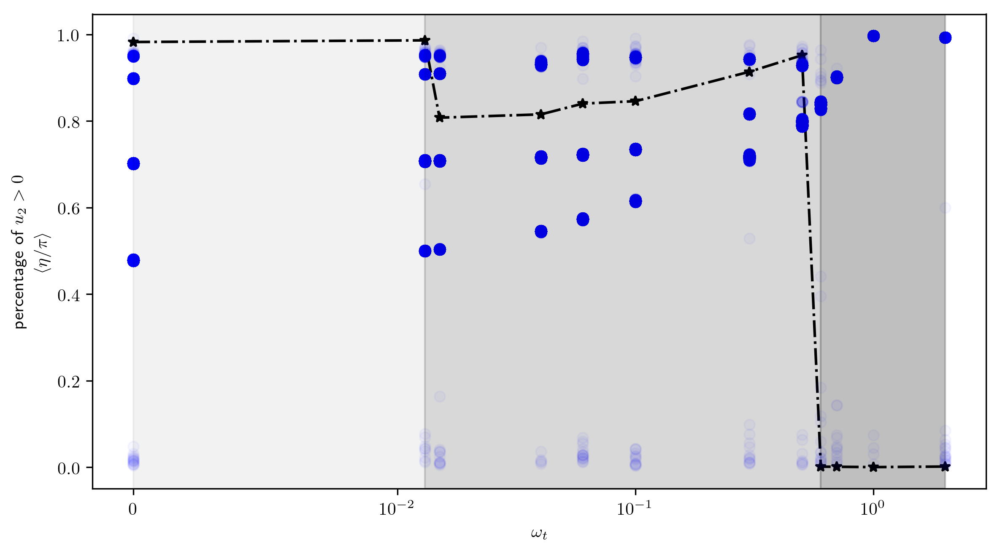

In [218]:
w_name_list = [(0,     'ecoC01B05_passive_psi_rada.pickle'), 
               (0.013, 'ecoC01B05_wt0.013_psi_rada.pickle'), 
               (0.015, 'ecoC01B05_wt0.015_psi_rada.pickle'), 
               (0.04,  'ecoC01B05_wt0.04_psi_rada.pickle'), 
#                (0.055, 'ecoC01B05_wt0.055_psi_rada.pickle'), 
#                (0.05,  'ecoC01B05_wt0.05_psi_rada.pickle'), 
               (0.06,  'ecoC01B05_wt0.06_psi_rada.pickle'), 
               (0.1,   'ecoC01B05_wt0.1_psi_rada.pickle'), 
               (0.3,   'ecoC01B05_wt0.3_psi_rada.pickle'), 
               (0.5,   'ecoC01B05_wt0.5_psi_rada.pickle'), 
               (0.6,   'ecoC01B05_wt0.6_psi_rada.pickle'), 
               (0.7,   'ecoC01B05_wt0.7_psi_rada.pickle'), 
               (1,     'ecoC01B05_wt1_psi_rada.pickle'), 
               (2,     'ecoC01B05_wt2_psi_rada.pickle'), ]
w_passive = 0.29928
figsize = np.array((16, 9)) * 0.5
dpi = 300

tw_list = np.array([i0[0] for i0 in w_name_list])
dy_list_list = []
std_eta_list_list = []
for tw, tname in w_name_list:
    with open(tname, 'rb') as myinput:
        _ = pickle.load(myinput)
        ini_theta_list, ini_phi_list, ini_psi_list, std_eta_list, psi_max_phi_list, \
        theta_autocorrelate_fre_list, phi_autocorrelate_fre_list, psi_autocorrelate_fre_list, \
        eta_autocorrelate_fre_list, dx_list, dy_list, dz_list, pickle_path_list = _
        dy_list_list.append(dy_list)
        std_eta_list_list.append(std_eta_list)
dy_pos = np.vstack([np.sum(i0>0)/i0.size for i0 in dy_list_list])
peclet = tw_list / w_passive


fig, axi = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
fig.patch.set_facecolor('white')
axi.axvspan(0, 0.013, alpha=0.1, color='gray')
axi.axvspan(0.013, 0.6, alpha=0.3, color='gray')
axi.axvspan(0.6, tw_list.max(), alpha=0.5, color='gray')
axi.plot(tw_list, dy_pos, '-.*k')
for (tw, _), std_eta_list in zip(w_name_list, std_eta_list_list):
    axi.plot(np.ones_like(std_eta_list[:, 0]) * tw, std_eta_list[:, 0] / np.pi, 'ob', alpha=0.03)
# ty1 = 
axi.set_xscale('symlog', linthreshx=1e-2)
axi.set_xlabel('$\\omega_t$')
axi.set_ylabel('percentage of $u_2 > 0$ \n $\\langle \\eta / \\pi \\rangle$')
plt.tight_layout()

(axi.get_xlim(), axi.get_ylim())

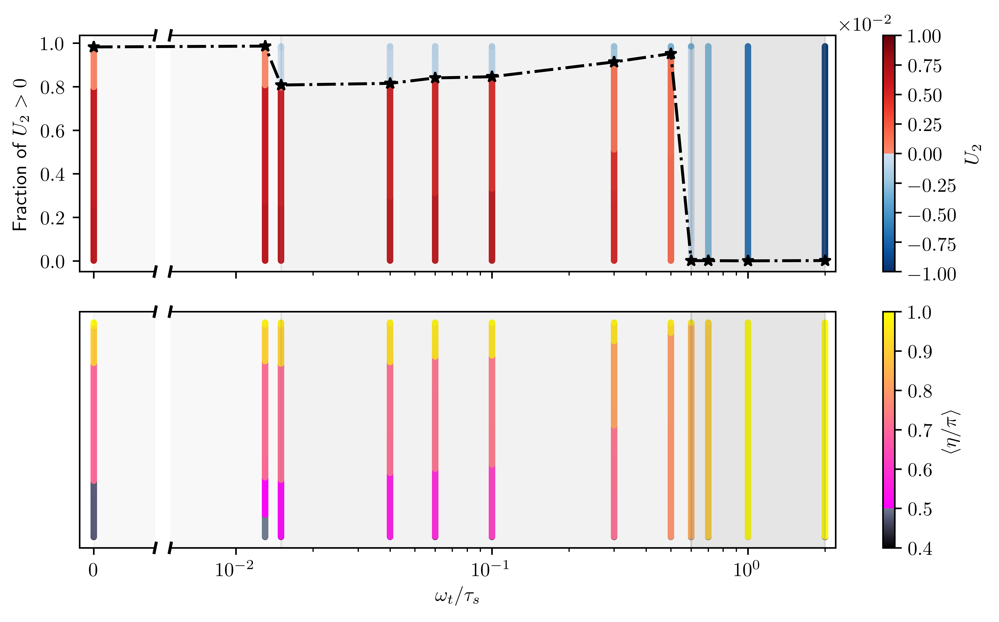

In [78]:
w_name_list = [(0,     'ecoC01B05_passive_psi_rada.pickle'), 
               (0.013, 'ecoC01B05_wt0.013_psi_rada.pickle'), 
               (0.015, 'ecoC01B05_wt0.015_psi_rada.pickle'), 
               (0.04,  'ecoC01B05_wt0.04_psi_rada.pickle'), 
#                (0.055, 'ecoC01B05_wt0.055_psi_rada.pickle'), 
#                (0.05,  'ecoC01B05_wt0.05_psi_rada.pickle'), 
               (0.06,  'ecoC01B05_wt0.06_psi_rada.pickle'), 
               (0.1,   'ecoC01B05_wt0.1_psi_rada.pickle'), 
               (0.3,   'ecoC01B05_wt0.3_psi_rada.pickle'), 
               (0.5,   'ecoC01B05_wt0.5_psi_rada.pickle'), 
               (0.6,   'ecoC01B05_wt0.6_psi_rada.pickle'), 
               (0.7,   'ecoC01B05_wt0.7_psi_rada.pickle'), 
               (1,     'ecoC01B05_wt1_psi_rada.pickle'), 
               (2,     'ecoC01B05_wt2_psi_rada.pickle'), ]
figsize = np.array((14, 9)) * 0.5
dpi = 800
xlim = (-0.001, 2.2)

tw_list = np.array([i0[0] for i0 in w_name_list])
dy_list_list = []
std_eta_list_list = []
for tw, tname in w_name_list:
    with open(tname, 'rb') as myinput:
        _ = pickle.load(myinput)
        ini_theta_list, ini_phi_list, ini_psi_list, std_eta_list, psi_max_phi_list, \
        theta_autocorrelate_fre_list, phi_autocorrelate_fre_list, psi_autocorrelate_fre_list, \
        eta_autocorrelate_fre_list, dx_list, dy_list, dz_list, pickle_path_list = _
        dy_list_list.append(dy_list)
        std_eta_list_list.append(std_eta_list)
dy_pos = np.vstack([np.sum(i0>0)/i0.size for i0 in dy_list_list])

fig, axs = plt.subplots(2, 1, figsize=figsize, dpi=dpi, sharex=True)
fig.patch.set_facecolor('white')
for axi in axs:
    axi.axvspan(0, 0.015, alpha=0.05, color='gray')
    axi.axvspan(0.015, 0.6, alpha=0.1, color='gray')
    axi.axvspan(0.6, tw_list.max(), alpha=0.2, color='gray')
axi1 = axs[0]
axi2 = axs[1]
colors11 = plt.get_cmap('Blues')
colors12 = plt.get_cmap('Reds')
colors1 = np.vstack((colors11(np.linspace(1, 0.2, 256)), colors12(np.linspace(0.4, 1, 256))))
cmap1 = mcolors.LinearSegmentedColormap.from_list('my_colormap', colors1)
colors21 = plt.get_cmap('bone')
colors22 = plt.get_cmap('spring')
colors2 = np.vstack((colors21(np.linspace(0, 0.5, 256)), colors22(np.linspace(0, 1, 256))))
cmap2 = mcolors.LinearSegmentedColormap.from_list('my_colormap', colors2)
# norm1 = spf.midLinearNorm(vmin=np.min([i0.min() for i0 in dy_list_list]), 
#                           vmax=np.max([i0.max() for i0 in dy_list_list]), 
#                           midpoint=0, clip=False)
norm1 = spf.midLinearNorm(vmin=-0.01, vmax=0.01, midpoint=0, clip=False)
norm2 = spf.midLinearNorm(vmin=0.4, vmax=1, midpoint=0.5, clip=False)
# norm2 = plt.Normalize(0, 1)
for (tw, _), std_eta_list, dy_list in zip(w_name_list, std_eta_list_list, dy_list_list):
    tx = np.ones_like(std_eta_list[:, 0]) * tw
    ty = np.arange(dy_list.size)
    c1 = np.flipud(np.sort(dy_list))
    c2 = np.sort(std_eta_list[:, 0] / np.pi)
#     print(c1.min(), c1.max())
#     print(c2[:50], c2.max())
#     print()
    tidx = c1 < 0
    sc1 = axi1.scatter(tx[tidx], ty[tidx], c=c1[tidx], cmap=cmap1, norm=norm1, s=5)
    tidx = np.logical_not(tidx)
    sc1 = axi1.scatter(tx[tidx], ty[tidx], c=c1[tidx], cmap=cmap1, norm=norm1, s=5)
    sc2 = axi2.scatter(tx, ty, c=c2, cmap=cmap2, norm=norm2, s=5)
        
fmt = matplotlib.ticker.ScalarFormatter(useMathText=False)
fmt.set_powerlimits((0, 0))
for axi, sci, title in zip(axs, (sc1, sc2), ('$U_2$', '$\\langle \\eta / \\pi \\rangle$')):
    cax = fig.colorbar(sci, ax=axi, orientation='vertical', format=fmt)
    cax.ax.set_ylabel(title)
    axi.set_xscale('symlog', linthreshx=1e-2, linscalex=0.5)
    axi.set_xlim(xlim)
    axi.axes.yaxis.set_visible(False)
axi2.set_xlabel('$\\omega_t / \\tau_s$')
axi2.xaxis.set_minor_locator(spf.MinorSymLogLocator(1e-1))
plt.tight_layout()

axi1_pos = axi1.get_position().bounds
tfct = axi1_pos[2] / axi1_pos[3] * figsize[0] / figsize[1]
dpos = np.array(((axi1_pos[2] * 0.1, axi1_pos[3] * -0.01, axi1_pos[2] * -0.98, axi1_pos[3] * 0.1)))
axi13 = fig.add_axes((axi1.get_position().bounds + dpos))
axi13.set_xticklabels([])
axi13.set_yticklabels([])
for t1 in axi13.spines:
    axi13.spines[t1].set_visible(False)
axi13.tick_params(axis=u'both', which=u'both',length=0)
dpos = np.array(((axi1_pos[2] * 0.1, 0, axi1_pos[2] * -0.98, 0)))
axi14 = fig.add_axes((axi1.get_position().bounds + dpos))
axi14.set_xticklabels([])
axi14.set_yticklabels([])
for t1 in axi14.spines:
    axi14.spines[t1].set_visible(False)
axi14.tick_params(axis=u'both', which=u'both',length=0)
td = .02 # how big to make the diagonal lines in axes coordinates
kwargs = dict(transform=axi14.transAxes, color='k', clip_on=False)
axi14.plot((-td * tfct,+td * tfct), (1-td,1+td), **kwargs)
axi14.plot((-td * tfct,+td * tfct), (-td,+td), **kwargs)
axi14.plot((1-td * tfct,1+td * tfct), (-td,+td), **kwargs)
axi14.plot((1-td * tfct,1+td * tfct),(1-td,1+td), **kwargs)

axi2_pos = axi2.get_position().bounds
tfct = axi2_pos[2] / axi2_pos[3] * figsize[0] / figsize[1]
dpos = np.array(((axi2_pos[2] * 0.1, axi2_pos[3] * -0.01, axi2_pos[2] * -0.98, axi2_pos[3] * 0.1)))
axi23 = fig.add_axes((axi2.get_position().bounds + dpos))
axi23.set_xticklabels([])
axi23.set_yticklabels([])
for t1 in axi23.spines:
    axi23.spines[t1].set_visible(False)
axi23.tick_params(axis=u'both', which=u'both',length=0)
dpos = np.array(((axi2_pos[2] * 0.1, 0, axi2_pos[2] * -0.98, 0)))
axi24 = fig.add_axes((axi2.get_position().bounds + dpos))
axi24.set_xticklabels([])
axi24.set_yticklabels([])
for t1 in axi24.spines:
    axi24.spines[t1].set_visible(False)
axi24.tick_params(axis=u'both', which=u'both',length=0)
td = .02 # how big to make the diagonal lines in axes coordinates
kwargs = dict(transform=axi24.transAxes, color='k', clip_on=False)
axi24.plot((-td * tfct,+td * tfct), (1-td,1+td), **kwargs)
axi24.plot((-td * tfct,+td * tfct), (-td,+td), **kwargs)
axi24.plot((1-td * tfct,1+td * tfct), (-td,+td), **kwargs)
axi24.plot((1-td * tfct,1+td * tfct),(1-td,1+td), **kwargs)

axi12 = fig.add_axes(axi1.get_position())
axi12.patch.set_alpha(0)
axi12.plot(tw_list, dy_pos, '-.*k')
# axi1.axes.xaxis.set_visible(False)
axi12.set_xlim(xlim)
axi12.set_xscale('symlog', linthreshx=1e-2, linscalex=0.5)
axi12.set_xticklabels([])
axi12.set_ylabel('Fraction of $U_2 > 0$')
for t1 in axi12.spines:
    axi12.spines[t1].set_visible(False)

In [84]:
[np.mean(i0) for i0 in dy_list_list]
# [np.std(i0) for i0 in dy_list_list]
np.sum(dy_list_list[0] > 0.000)

8103

In [81]:
w_name_list

[(0, 'ecoC01B05_passive_psi_rada.pickle'),
 (0.013, 'ecoC01B05_wt0.013_psi_rada.pickle'),
 (0.015, 'ecoC01B05_wt0.015_psi_rada.pickle'),
 (0.04, 'ecoC01B05_wt0.04_psi_rada.pickle'),
 (0.06, 'ecoC01B05_wt0.06_psi_rada.pickle'),
 (0.1, 'ecoC01B05_wt0.1_psi_rada.pickle'),
 (0.3, 'ecoC01B05_wt0.3_psi_rada.pickle'),
 (0.5, 'ecoC01B05_wt0.5_psi_rada.pickle'),
 (0.6, 'ecoC01B05_wt0.6_psi_rada.pickle'),
 (0.7, 'ecoC01B05_wt0.7_psi_rada.pickle'),
 (1, 'ecoC01B05_wt1_psi_rada.pickle'),
 (2, 'ecoC01B05_wt2_psi_rada.pickle')]

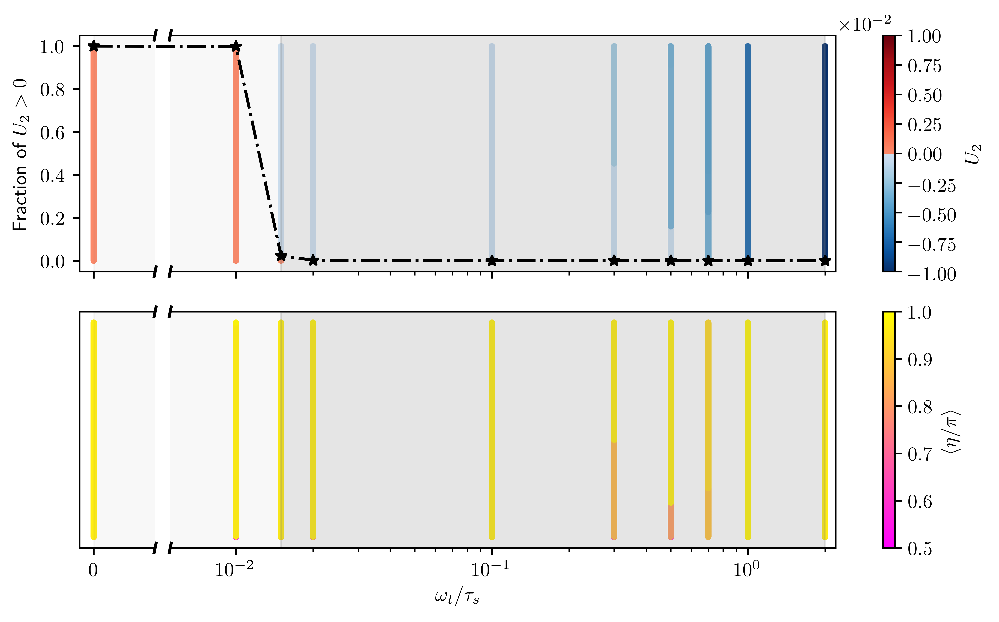

In [48]:
w_name_list = [(0,     'ecoB01B05_w0_psi_rada.pickle'), 
               (0.01,  'ecoB01B05_w0.01_psi_rada.pickle'), 
               (0.015, 'ecoB01B05_w0.015_psi_rada.pickle'), 
               (0.02,  'ecoB01B05_w0.02_psi_rada.pickle'), 
               (0.1,   'ecoB01B05_w0.1_psi_rada.pickle'), 
#                (0.2,   'ecoB01B05_w0.2_psi_rada.pickle'), 
               (0.3,   'ecoB01B05_w0.3_psi_rada.pickle'), 
#                (0.4,   'ecoB01B05_w0.4_psi_rada.pickle'), 
               (0.5,   'ecoB01B05_w0.5_psi_rada.pickle'), 
#                (0.6,   'ecoB01B05_w0.6_psi_rada.pickle'), 
               (0.7,   'ecoB01B05_w0.7_psi_rada.pickle'), 
               (1,     'ecoB01B05_w1_psi_rada.pickle'), 
               (2,     'ecoB01B05_w2_psi_rada.pickle'), ]
figsize = np.array((14, 9)) * 0.5
dpi = 800
xlim = (-0.001, 2.2)

tw_list = np.array([i0[0] for i0 in w_name_list])
dy_list_list = []
std_eta_list_list = []
for tw, tname in w_name_list:
    with open(tname, 'rb') as myinput:
        _ = pickle.load(myinput)
        ini_theta_list, ini_phi_list, ini_psi_list, std_eta_list, psi_max_phi_list, \
        theta_autocorrelate_fre_list, phi_autocorrelate_fre_list, psi_autocorrelate_fre_list, \
        eta_autocorrelate_fre_list, dx_list, dy_list, dz_list, pickle_path_list = _
        dy_list_list.append(dy_list)
        std_eta_list_list.append(std_eta_list)
dy_pos = np.vstack([np.sum(i0>0)/i0.size for i0 in dy_list_list])

fig, axs = plt.subplots(2, 1, figsize=figsize, dpi=dpi, sharex=True)
fig.patch.set_facecolor('white')
for axi in axs:
    axi.axvspan(0, 0.015, alpha=0.05, color='gray')
#     axi.axvspan(0.015, 0.6, alpha=0.3, color='gray')
    axi.axvspan(0.015, tw_list.max(), alpha=0.2, color='gray')
axi1 = axs[0]
axi2 = axs[1]
colors11 = plt.get_cmap('Blues')
colors12 = plt.get_cmap('Reds')
colors1 = np.vstack((colors11(np.linspace(1, 0.2, 256)), colors12(np.linspace(0.4, 1, 256))))
cmap1 = mcolors.LinearSegmentedColormap.from_list('my_colormap', colors1)
colors21 = plt.get_cmap('bone')
colors22 = plt.get_cmap('spring')
# colors2 = np.vstack((colors21(np.linspace(0, 0.5, 256)), colors22(np.linspace(0, 1, 256))))
colors2 = colors22(np.linspace(0, 1, 256))
cmap2 = mcolors.LinearSegmentedColormap.from_list('my_colormap', colors2)
# norm1 = spf.midLinearNorm(vmin=np.min([i0.min() for i0 in dy_list_list]), 
#                           vmax=np.max([i0.max() for i0 in dy_list_list]), 
#                           midpoint=0, clip=False)
norm1 = spf.midLinearNorm(vmin=-0.01, vmax=0.01, midpoint=0, clip=False)
# norm2 = spf.midLinearNorm(vmin=0.7, vmax=1, midpoint=0.8, clip=False)
norm2 = plt.Normalize(vmin=0.5, vmax=1, clip=False)
for (tw, _), std_eta_list, dy_list in zip(w_name_list, std_eta_list_list, dy_list_list):
    tx = np.ones_like(std_eta_list[:, 0]) * tw
    ty = np.arange(dy_list.size)
    c1 = np.flipud(np.sort(dy_list))
    c2 = np.sort(std_eta_list[:, 0] / np.pi)
#     print(c1.min(), c1.max())
#     print(c2[:50], c2.max())
#     print()
    tidx = c1 < 0
    sc1 = axi1.scatter(tx[tidx], ty[tidx], c=c1[tidx], cmap=cmap1, norm=norm1, s=5)
    tidx = np.logical_not(tidx)
    sc1 = axi1.scatter(tx[tidx], ty[tidx], c=c1[tidx], cmap=cmap1, norm=norm1, s=5)
    sc2 = axi2.scatter(tx, ty, c=c2, cmap=cmap2, norm=norm2, s=5)
    
fmt = matplotlib.ticker.ScalarFormatter(useMathText=False)
fmt.set_powerlimits((0, 0))
for axi, sci, title in zip(axs, (sc1, sc2), ('$U_2$', '$\\langle \\eta / \\pi \\rangle$')):
    cax = fig.colorbar(sci, ax=axi, orientation='vertical', format=fmt)
    cax.ax.set_ylabel(title)
    axi.set_xscale('symlog', linthreshx=1e-2, linscalex=0.5)
    axi.set_xlim(xlim)
    axi.axes.yaxis.set_visible(False)
axi2.set_xlabel('$\\omega_t / \\tau_s$')
axi2.xaxis.set_minor_locator(spf.MinorSymLogLocator(1e-1))
plt.tight_layout()

axi1_pos = axi1.get_position().bounds
tfct = axi1_pos[2] / axi1_pos[3] * figsize[0] / figsize[1]
dpos = np.array(((axi1_pos[2] * 0.1, axi1_pos[3] * -0.01, axi1_pos[2] * -0.98, axi1_pos[3] * 0.1)))
axi13 = fig.add_axes((axi1.get_position().bounds + dpos))
axi13.set_xticklabels([])
axi13.set_yticklabels([])
for t1 in axi13.spines:
    axi13.spines[t1].set_visible(False)
axi13.tick_params(axis=u'both', which=u'both',length=0)
dpos = np.array(((axi1_pos[2] * 0.1, 0, axi1_pos[2] * -0.98, 0)))
axi14 = fig.add_axes((axi1.get_position().bounds + dpos))
axi14.set_xticklabels([])
axi14.set_yticklabels([])
for t1 in axi14.spines:
    axi14.spines[t1].set_visible(False)
axi14.tick_params(axis=u'both', which=u'both',length=0)
td = .02 # how big to make the diagonal lines in axes coordinates
kwargs = dict(transform=axi14.transAxes, color='k', clip_on=False)
axi14.plot((-td * tfct,+td * tfct), (1-td,1+td), **kwargs)
axi14.plot((-td * tfct,+td * tfct), (-td,+td), **kwargs)
axi14.plot((1-td * tfct,1+td * tfct), (-td,+td), **kwargs)
axi14.plot((1-td * tfct,1+td * tfct),(1-td,1+td), **kwargs)

axi2_pos = axi2.get_position().bounds
tfct = axi2_pos[2] / axi2_pos[3] * figsize[0] / figsize[1]
dpos = np.array(((axi2_pos[2] * 0.1, axi2_pos[3] * -0.01, axi2_pos[2] * -0.98, axi2_pos[3] * 0.1)))
axi23 = fig.add_axes((axi2.get_position().bounds + dpos))
axi23.set_xticklabels([])
axi23.set_yticklabels([])
for t1 in axi23.spines:
    axi23.spines[t1].set_visible(False)
axi23.tick_params(axis=u'both', which=u'both',length=0)
dpos = np.array(((axi2_pos[2] * 0.1, 0, axi2_pos[2] * -0.98, 0)))
axi24 = fig.add_axes((axi2.get_position().bounds + dpos))
axi24.set_xticklabels([])
axi24.set_yticklabels([])
for t1 in axi24.spines:
    axi24.spines[t1].set_visible(False)
axi24.tick_params(axis=u'both', which=u'both',length=0)
td = .02 # how big to make the diagonal lines in axes coordinates
kwargs = dict(transform=axi24.transAxes, color='k', clip_on=False)
axi24.plot((-td * tfct,+td * tfct), (1-td,1+td), **kwargs)
axi24.plot((-td * tfct,+td * tfct), (-td,+td), **kwargs)
axi24.plot((1-td * tfct,1+td * tfct), (-td,+td), **kwargs)
axi24.plot((1-td * tfct,1+td * tfct),(1-td,1+td), **kwargs)

axi12 = fig.add_axes(axi1.get_position())
axi12.patch.set_alpha(0)
axi12.plot(tw_list, dy_pos, '-.*k')
# axi1.axes.xaxis.set_visible(False)
axi12.set_xlim(xlim)
axi12.set_xscale('symlog', linthreshx=1e-2, linscalex=0.5)
axi12.set_xticklabels([])
axi12.set_ylabel('Fraction of $U_2 > 0$')
for t1 in axi12.spines:
    axi12.spines[t1].set_visible(False)

(array([ 38.,  59.,  64.,  31.,  23.,  12.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,  22., 128.,  29.,  34., 211., 248.,
        101.]),
 array([0.87808207, 0.87855851, 0.87903496, 0.8795114 , 0.87998784,
        0.88046428, 0.88094072, 0.88141717, 0.88189361, 0.88237005,
        0.88284649, 0.88332294, 0.88379938, 0.88427582, 0.88475226,
        0.8852287 , 0.88570515, 0.88618159, 0.88665803, 0.88713447,
        0.88761091, 0.88808736, 0.8885638 , 0.

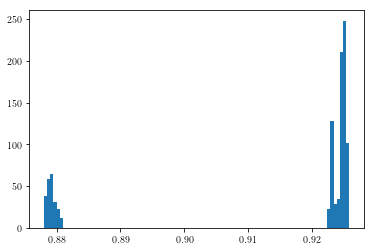

In [73]:
# plt.hist(dy_list_list[5], 100)
plt.hist(std_eta_list_list[7][:, 0] / np.pi, 100)

In [69]:
[np.mean(i0) for i0 in dy_list_list]
# [np.std(i0) for i0 in dy_list_list]
dy_list_list[5]

array([-0.00205104, -0.00205414, -0.00051789, -0.00051789, -0.00205111,
       -0.00205305, -0.00205176, -0.00205359, -0.0020526 , -0.00205481,
       -0.00051801, -0.00205023, -0.00205182, -0.00205178, -0.00205329,
       -0.00205326, -0.00051798, -0.00051766, -0.00051754, -0.00051806,
       -0.00204832, -0.00204998, -0.00051799, -0.00205277, -0.000518  ,
       -0.00051798, -0.00205032, -0.00205368, -0.00051775, -0.00051809,
       -0.00205274, -0.00205207, -0.00205338, -0.000518  , -0.0005178 ,
       -0.00051805, -0.00051801, -0.00051793, -0.00205294, -0.00051742,
       -0.00205372, -0.00205214, -0.00205517, -0.00205043, -0.0005176 ,
       -0.00051809, -0.00051819, -0.00204959, -0.00205017, -0.00205174,
       -0.00205186, -0.00205246, -0.00051811, -0.00205111, -0.00051781,
       -0.00051805, -0.00051784, -0.00051807, -0.00051803, -0.00051806,
       -0.00205154, -0.00051803, -0.00051796, -0.00204516, -0.00204655,
       -0.00051818, -0.00205088, -0.0005177 , -0.00051776, -0.00

In [62]:
w_name_list[5]

(0.3, 'ecoB01B05_w0.3_psi_rada.pickle')

## trajectory in x1-x2 plane

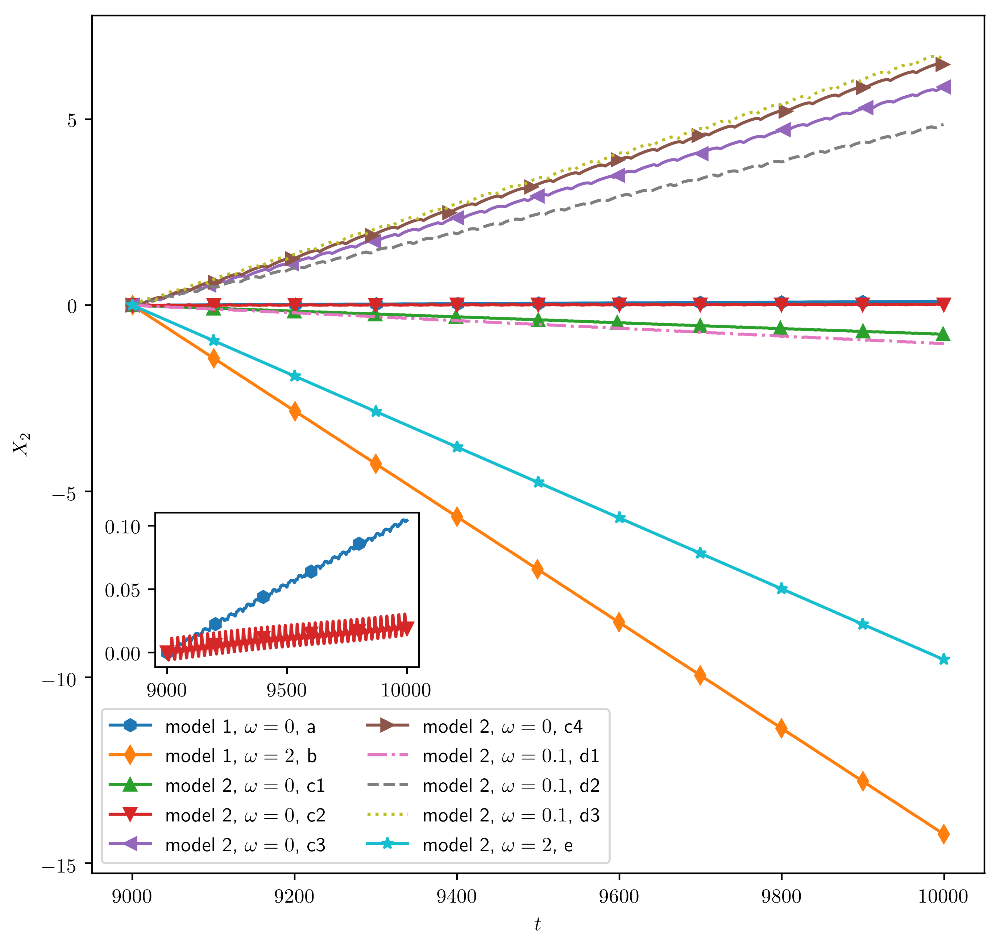

In [82]:
label_name_list = np.array([('model 1, $\\omega=0$, a',     'ecoB01B05_w0.pickle', '-h', 'C0'), 
#                             ('model 1, $\\omega=1$, b',     'ecoB01B05_w1.pickle', '-d', 'C1'), 
                            ('model 1, $\\omega=2$, b',     'ecoB01B05_w2.pickle', '-d', 'C1'), 
                            ('model 2, $\\omega=0$, c1',     'ecoC01B05_case_a.pickle', '-^', 'C2'), 
                            ('model 2, $\\omega=0$, c2',     'ecoC01B05_case_b.pickle', '-v', 'C3'), 
                            ('model 2, $\\omega=0$, c3',     'ecoC01B05_case_c.pickle', '-<', 'C4'), 
                            ('model 2, $\\omega=0$, c4',     'ecoC01B05_case_d.pickle', '->', 'C5'), 
                            ('model 2, $\\omega=0.1$, d1',   'ecoC01B05_case_e.pickle', '-.', 'C6'), 
                            ('model 2, $\\omega=0.1$, d2',   'ecoC01B05_case_f.pickle', '--', 'C7'), 
                            ('model 2, $\\omega=0.1$, d3',   'ecoC01B05_case_g.pickle', ':', 'C8'), 
#                             ('model 2, $\\omega=1$, e',      'ecoC01B05_case_h.pickle', '-*', 'C9'),
                            ('model 2, $\\omega=2$, e',      'ecoC01B05_wt2.pickle', '-*', 'C9'),])
sub_idx_list = [0, 3]
figsize = np.array((20, 19)) * 0.35
dpi = 400
move_x3 = 1

Table_t_list = []
Table_X_list = []
for _, filename, _, _ in label_name_list:
    with open(filename, 'rb') as handle:
        tpick = pickle.load(handle)
        flow_strength = tpick['problem_kwargs']['flow_strength']
        Table_t = tpick['Table_t']
        Table_X = tpick['Table_X']
        t_min = 9000
        Table_X = Table_X[Table_t > t_min]
        Table_t = Table_t[Table_t > t_min]
        # move_z
        dz = move_x3 - np.mean(Table_X[:, 2])
        Table_X[:, 2] = Table_X[:, 2] + dz
        Xz_mean = (Table_t - Table_t[0]) * dz * flow_strength
        Table_X[:, 0] = Table_X[:, 0] + Xz_mean
        # move to origion
        Table_X = Table_X - Table_X[0]
        Table_t_list.append(Table_t)
        Table_X_list.append(Table_X)
Table_t_list = np.array(Table_t_list)
Table_X_list = np.array(Table_X_list)

fig, axi = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
# fig.patch.set_facecolor('white')
for (tlabel, _, linestyle, color), Table_t, Table_X in zip(label_name_list, Table_t_list, Table_X_list):
    # axi.plot(Table_X[0, 0], Table_X[0, 1], '*k', ms=10)
    markevery = Table_X.shape[0] // 10
#     axi.plot(Table_X[:, 0], Table_X[:, 1], linestyle, label=tlabel, markevery=markevery, color=color)
    axi.plot(Table_t, Table_X[:, 1], linestyle, label=tlabel, markevery=markevery, color=color)
axi.legend(loc='lower left', ncol=2)
# axi.set_xlim(0, 100)
# axi.set_ylim(-1, 1)
axi.set_xlabel('$t$')
axi.set_ylabel('$X_2$')
plt.tight_layout()

axi = fig.add_axes([0.16, 0.3, 0.26, 0.16])
for (tlabel, _, linestyle, color), Table_t, Table_X in zip(label_name_list[sub_idx_list], 
                                                           Table_t_list[sub_idx_list], 
                                                           Table_X_list[sub_idx_list]):
    markevery = Table_X.shape[0] // 5
    axi.plot(Table_t, Table_X[:, 1], linestyle, label=tlabel, markevery=markevery, color=color)


In [51]:
#         axi.set_xticks(xticks)
#         axi.set_xticklabels(xticks)
axi.get_xticks()
new_yticklabels = axi.get_yticklabels()
new_yticklabels[2] = []
# new_yticklabels[2] = []
# new_yticklabels[2] = []
# axi.get_xticks()[[0, 1, -1]]

## compare left and right hand chirality

/anaconda3/envs/py35/lib/python3.5/site-packages/matplotlib/figure.py:2369: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


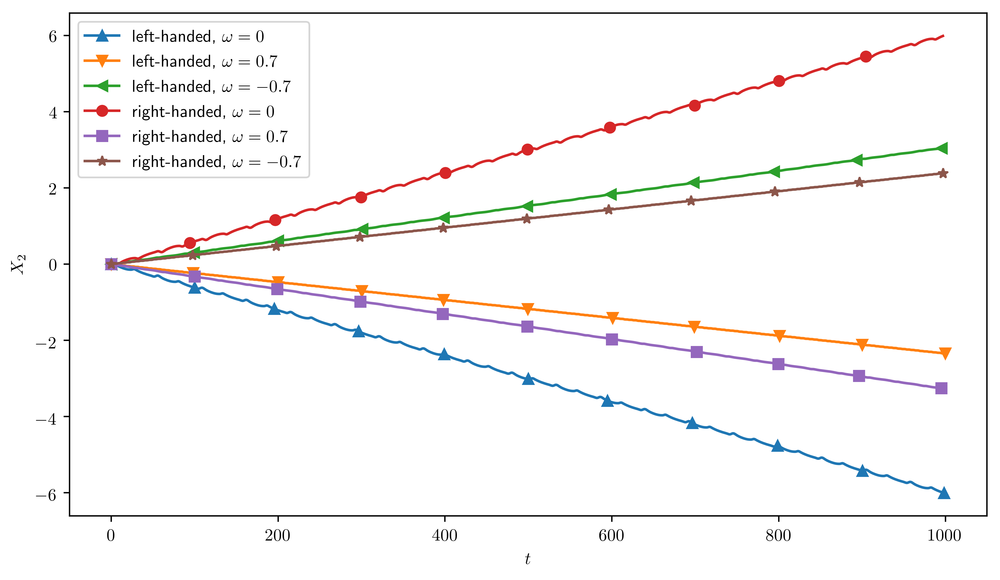

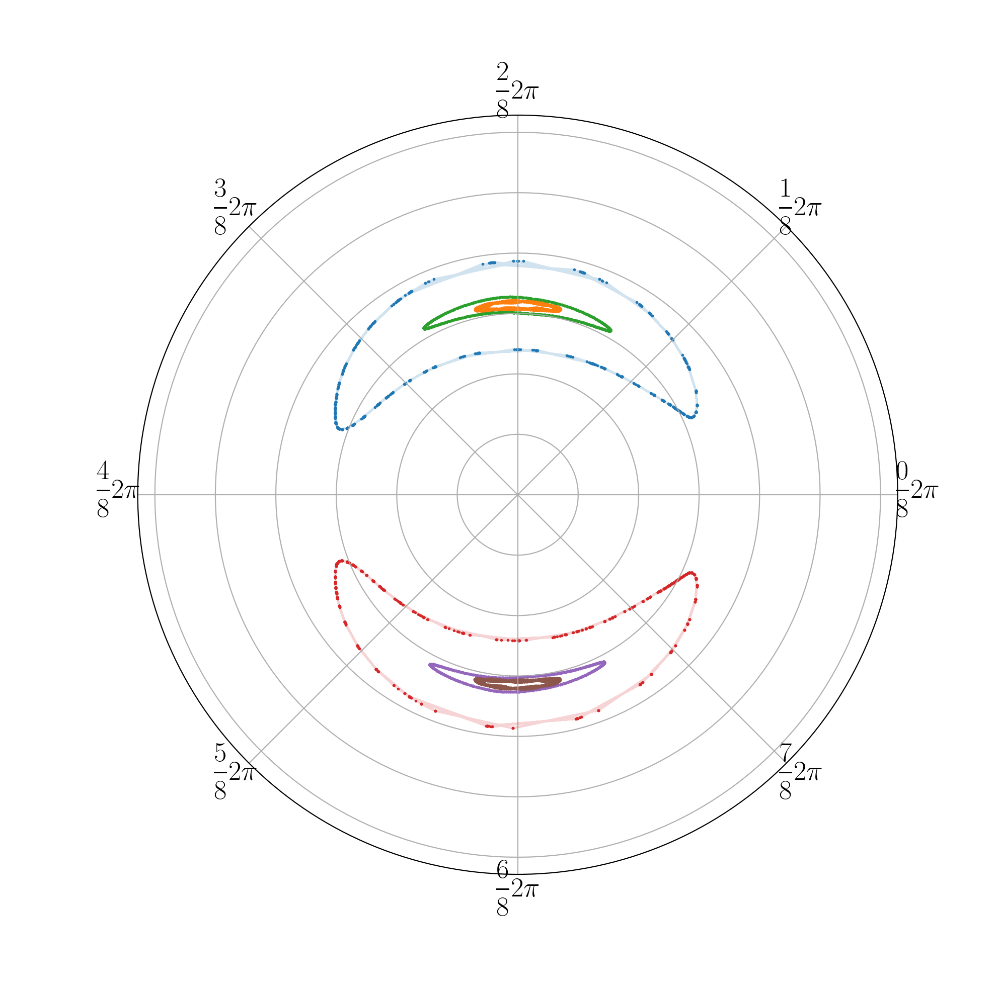

In [153]:
# pickle_l1 = '/home/zhangji/stokes_flow_master/head_Force/do_calculate_table/ecoC01B05_left_wt0.7_psi_rada/th2.514_ph3.060_ps5.929_D20200513_T055428.pickle'
# pickle_r1 = '/home/zhangji/stokes_flow_master/head_Force/do_calculate_table/ecoC01B05_wt0.7_psi_rada/th2.732_ph3.536_ps3.827_D20200502_T115202.pickle'
pickle_l1 = 'ecoC01B05_left_w0.7.pickle'
pickle_r1 = 'ecoC01B05_w0.7.pickle'
pickle_l2 = 'ecoC01B05_left_w-0.7.pickle'
pickle_r2 = 'ecoC01B05_w-0.7.pickle'
pickle_l3 = 'ecoC01B05_left_w0.pickle'
pickle_r3 = 'ecoC01B05_w0.pickle'
figsize = np.array((16, 9)) * 0.6
dpi = 500

def _plt_fun(tpickle, label, linestyle):
    with open(tpickle, 'rb') as handle:
        tpick = pickle.load(handle)
    Table_t = tpick['Table_t']
    Table_dt = tpick['Table_dt']
    Table_X = tpick['Table_X']
    Table_P = tpick['Table_P']
    Table_P2 = tpick['Table_P2']
    Table_theta = tpick['Table_theta']
    Table_phi = tpick['Table_phi']
    Table_psi = tpick['Table_psi']
    Table_eta = tpick['Table_eta']
    idx = Table_t > 9000
    t1 = Table_X[idx, 1] - Table_X[idx, 1][0]
    markevery = np.sum(idx) // 10
    axi.plot(Table_t[idx]-Table_t[idx][0], t1, linestyle, markevery=markevery, label=label)
    ax1.plot(Table_phi[idx], Table_theta[idx], '-', alpha=0.2)
    ax1.scatter(Table_phi[idx], Table_theta[idx], s=1)
    return True

fig, axi = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
fig.patch.set_facecolor('white')
fig = plt.figure(figsize=(10, 10), dpi=200)
fig.patch.set_facecolor('white')
ax0 = fig.add_subplot(111)
ax0.set_xlim(-np.pi * 1.1, np.pi * 1.1)
ax0.set_ylim(-np.pi * 1.1, np.pi * 1.1)
ax0.axis('off')
ax0.set_aspect('equal')
ax1 = fig.add_axes(ax0.get_position(), projection='polar')
ax1.patch.set_alpha(0)
plt.sca(ax1)
ax1.set_ylim(0, np.pi)
ax1.xaxis.set_ticklabels(['$\dfrac{%d}{8}2\pi$' % i0 for i0 in np.arange(8)])
ax1.yaxis.set_ticklabels([])
plt.xticks(fontsize=fontsize * 0.5)
plt.yticks(fontsize=fontsize * 0.5)

_plt_fun(pickle_l3, 'left-handed, $\\omega=0$', linestyle='-^')
_plt_fun(pickle_l1, 'left-handed, $\\omega=0.7$', linestyle='-v')
_plt_fun(pickle_l2, 'left-handed, $\\omega=-0.7$', linestyle='-<')
_plt_fun(pickle_r3, 'right-handed, $\\omega=0$', linestyle='-o')
_plt_fun(pickle_r1, 'right-handed, $\\omega=0.7$', linestyle='-s')
_plt_fun(pickle_r2, 'right-handed, $\\omega=-0.7$', linestyle='-*')

axi.set_xlabel('$t$')
axi.set_ylabel('$X_2$')
axi.legend(loc='upper left')
plt.tight_layout()


In [94]:
('right-handed, $\\omega=0$,   $\\tau_s=1$',  '-^', 'ecoC01B05_w0_th1.571_ph4.712_ps0.000_D20200720_T131616.pickle'), 
   

(('right-handed, $\\omega=0$,   $\\tau_s=1$',
  '-^',
  'ecoC01B05_w0_th1.571_ph4.712_ps0.000_D20200720_T131616.pickle'),)

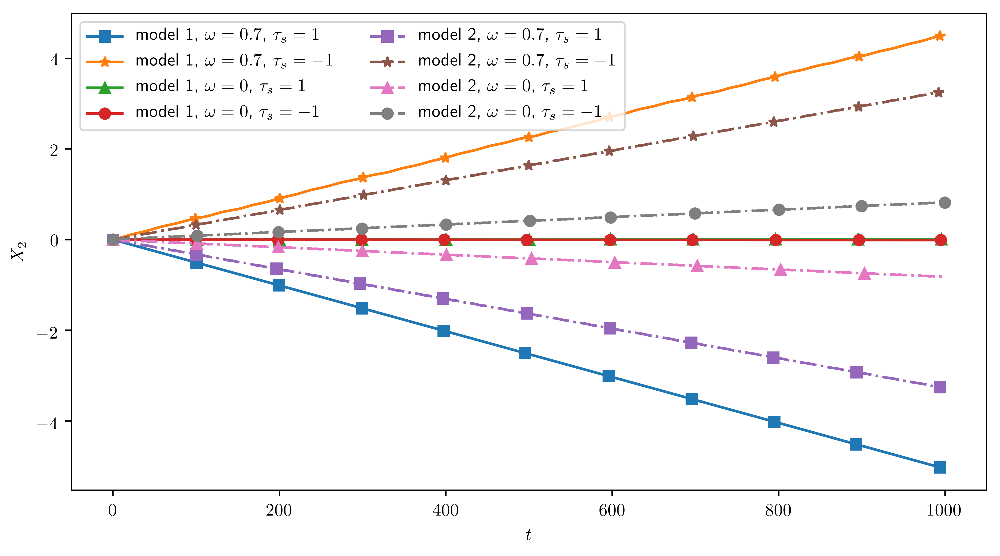

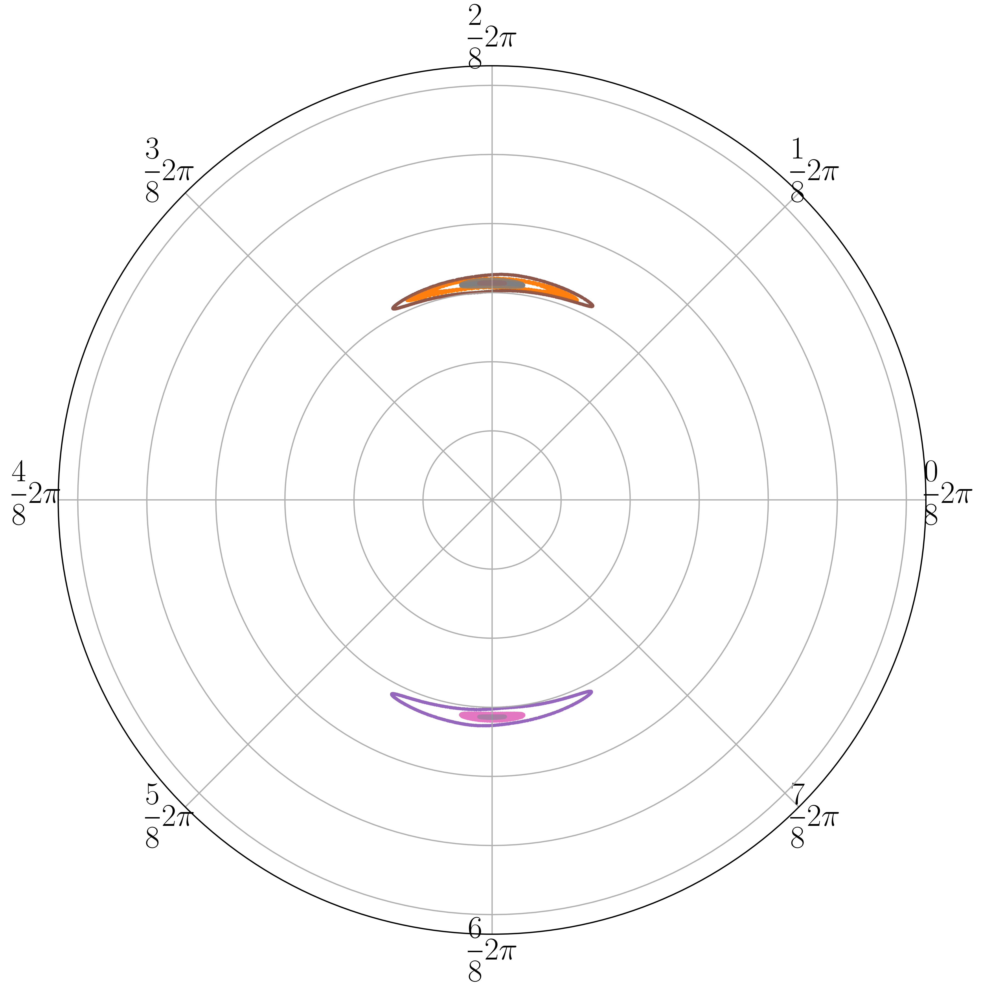

In [155]:
# # ecoC01B05
# pickle_list = [
#     ('model 2, $\\omega=0.7$, $\\tau_s=1$',  '-s', 'ecoC01B05_w0.7_th1.571_ph4.712_ps0.000_D20200720_T131303.pickle'), 
#     ('model 2, $\\omega=0.7$, $\\tau_s=-1$', '-*', 'ecoC01B05_w0.7_invS_th1.571_ph1.571_ps0.000_D20200720_T140203.pickle'), 
#     ('model 2, $\\omega=0$,   $\\tau_s=1$',  '-^', 'ecoC01B05_w0_th1.571_ph4.712_ps0.000_D20200720_T131616.pickle'), 
#     ('model 2, $\\omega=0$,   $\\tau_s=-1$', '-o', 'ecoC01B05_w0_invS_th1.571_ph1.571_ps0.000_D20200720_T140512.pickle'), 
#     ]
# # ecoB01B05
# pickle_list = [
# #     ('model 1, $\\omega=2$, $\\tau_s=1$',  '-s', 'ecoB01B05_w2_th1.571_ph4.712_ps0.000_D20200720_T142617.pickle'), 
# #     ('model 1, $\\omega=2$, $\\tau_s=-1$', '-*', 'ecoB01B05_w2_invS_th1.571_ph1.571_ps0.000_D20200720_T142838.pickle'), 
#     ('model 1, $\\omega=0.7$, $\\tau_s=1$',  '-s', 'ecoB01B05_w0.7_th1.571_ph4.712_ps0.000_D20200720_T143416.pickle'), 
#     ('model 1, $\\omega=0.7$, $\\tau_s=-1$', '-*', 'ecoB01B05_w0.7_invS_th1.571_ph1.571_ps0.000_D20200720_T143540.pickle'), 
#     ('model 1, $\\omega=0$, $\\tau_s=1$',  '-^', 'ecoB01B05_w0_th1.571_ph4.712_ps0.000_D20200720_T142413.pickle'), 
#     ('model 1, $\\omega=0$, $\\tau_s=-1$', '-o', 'ecoB01B05_w0_invS_th1.571_ph1.571_ps0.000_D20200720_T142516.pickle'), 
#     ]

pickle_list = [
    ('model 1, $\\omega=0.7$, $\\tau_s=1$',  '-s', 'ecoB01B05_w0.7_th1.571_ph4.712_ps0.000_D20200720_T143416.pickle'), 
    ('model 1, $\\omega=0.7$, $\\tau_s=-1$', '-*', 'ecoB01B05_w0.7_invS_th1.571_ph1.571_ps0.000_D20200720_T143540.pickle'), 
    ('model 1, $\\omega=0$, $\\tau_s=1$',  '-^', 'ecoB01B05_w0_th1.571_ph4.712_ps0.000_D20200720_T142413.pickle'), 
    ('model 1, $\\omega=0$, $\\tau_s=-1$', '-o', 'ecoB01B05_w0_invS_th1.571_ph1.571_ps0.000_D20200720_T142516.pickle'), 
    ('model 2, $\\omega=0.7$, $\\tau_s=1$',  '-.s', 'ecoC01B05_w0.7_th1.571_ph4.712_ps0.000_D20200720_T131303.pickle'), 
    ('model 2, $\\omega=0.7$, $\\tau_s=-1$', '-.*', 'ecoC01B05_w0.7_invS_th1.571_ph1.571_ps0.000_D20200720_T140203.pickle'), 
    ('model 2, $\\omega=0$,   $\\tau_s=1$',  '-.^', 'ecoC01B05_w0_th1.571_ph4.712_ps0.000_D20200720_T131616.pickle'), 
    ('model 2, $\\omega=0$,   $\\tau_s=-1$', '-.o', 'ecoC01B05_w0_invS_th1.571_ph1.571_ps0.000_D20200720_T140512.pickle'), 
    ]
figsize = np.array((16, 9)) * 0.5
dpi = 500

def _plt_fun(tpickle, label, linestyle):
    with open(tpickle, 'rb') as handle:
        tpick = pickle.load(handle)
    Table_t = tpick['Table_t']
    Table_dt = tpick['Table_dt']
    Table_X = tpick['Table_X']
    Table_P = tpick['Table_P']
    Table_P2 = tpick['Table_P2']
    Table_theta = tpick['Table_theta']
    Table_phi = tpick['Table_phi']
    Table_psi = tpick['Table_psi']
    Table_eta = tpick['Table_eta']
    idx = Table_t > 9000
    t1 = Table_X[idx, 1] - Table_X[idx, 1][0]
    markevery = np.sum(idx) // 10
    axi.plot(Table_t[idx]-Table_t[idx][0], t1, linestyle, markevery=markevery, label=label)
    ax1.plot(Table_phi[idx], Table_theta[idx], '-', alpha=0.2)
    ax1.scatter(Table_phi[idx], Table_theta[idx], s=1)
    return True

fig, axi = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
fig.patch.set_facecolor('white')
fig = plt.figure(figsize=(10, 10), dpi=dpi)
fig.patch.set_facecolor('white')
ax0 = fig.add_subplot(111)
ax0.set_xlim(-np.pi * 1.1, np.pi * 1.1)
ax0.set_ylim(-np.pi * 1.1, np.pi * 1.1)
ax0.axis('off')
ax0.set_aspect('equal')
ax1 = fig.add_axes(ax0.get_position(), projection='polar')
ax1.patch.set_alpha(0)
plt.sca(ax1)
ax1.set_ylim(0, np.pi)
ax1.xaxis.set_ticklabels(['$\dfrac{%d}{8}2\pi$' % i0 for i0 in np.arange(8)])
ax1.yaxis.set_ticklabels([])
plt.xticks(fontsize=fontsize * 0.5)
plt.yticks(fontsize=fontsize * 0.5)

for tlabel, tlinestyle, tpickle in pickle_list:
    _plt_fun(tpickle, tlabel, linestyle=tlinestyle)

axi.set_xlabel('$t$')
axi.set_ylabel('$X_2$')
axi.legend(loc='upper left', ncol=2)
plt.sca(axi)
plt.tight_layout()


## rheotaxis

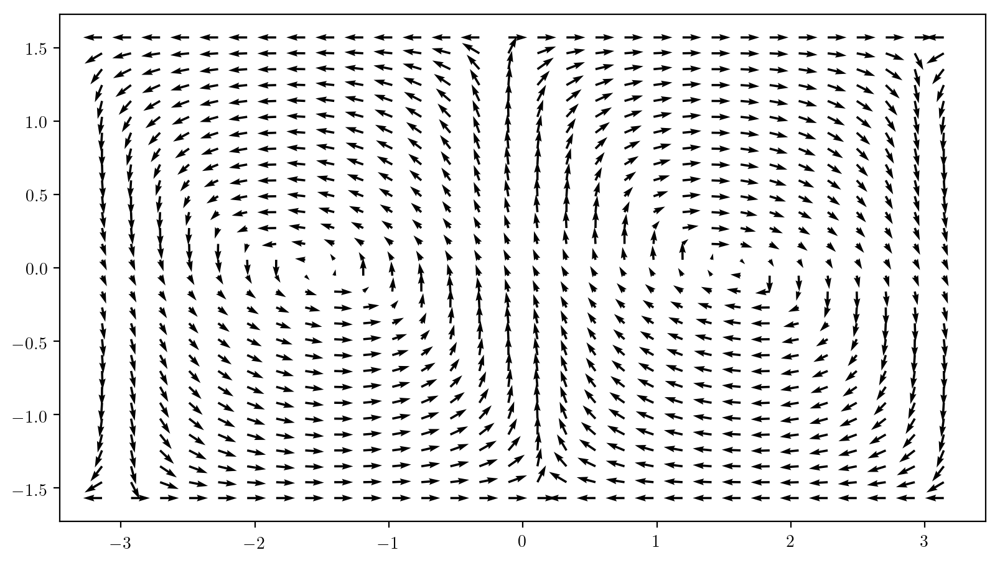

In [2]:
# Jeffory orbit + rheotaxis, Jing2020 version
dtheta = lambda theta, phi, wE4x, wE4y: 1/2 * (1 - wE4y * np.cos(2 * theta)) * np.cos(phi) + \
                                        1/2 * wE4x * np.sin(phi) * np.sin(theta)
dphi = lambda theta, phi, wE4x, wE4y: 1/2 * (1 + wE4y) * np.sin(phi) * np.tan(theta) + \
                                      1/2 * wE4x * np.cos(phi) * np.cos(2 * theta) / np.cos(theta)

wE4x = -0.3
wE4y = 0.8
figsize = np.array((16, 9)) * 0.6
dpi = 200
# theta = np.linspace(0, np.pi, 21)
# phi = np.linspace(0, 2*np.pi, 21)
theta = np.linspace(-np.pi/2, np.pi/2, 30)
phi = np.linspace(-np.pi, np.pi, 30)
# theta = np.linspace(-np.pi/4, np.pi/4*3, 30)
# phi = np.linspace(-np.pi/2, np.pi/2*3, 30)

# theta, phi = np.meshgrid(theta, phi, indexing='ij')
theta, phi = np.meshgrid(theta, phi)
# theta = np.pi / 2 - theta
# phi = np.pi - phi

# fig, axs = plt.subplots(1, 1, figsize=figsize, dpi=dpi, subplot_kw=dict(polar=True))
fig, axs = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
fig.patch.set_facecolor('white')
axi = axs
dth, dph = dtheta(theta, phi, wE4x, wE4y), dphi(theta, phi, wE4x, wE4y)
dth = dth / np.sqrt(dth ** 2 + dph ** 2)
dph = dph / np.sqrt(dth ** 2 + dph ** 2)
axi.quiver(phi, theta, dph, dth)


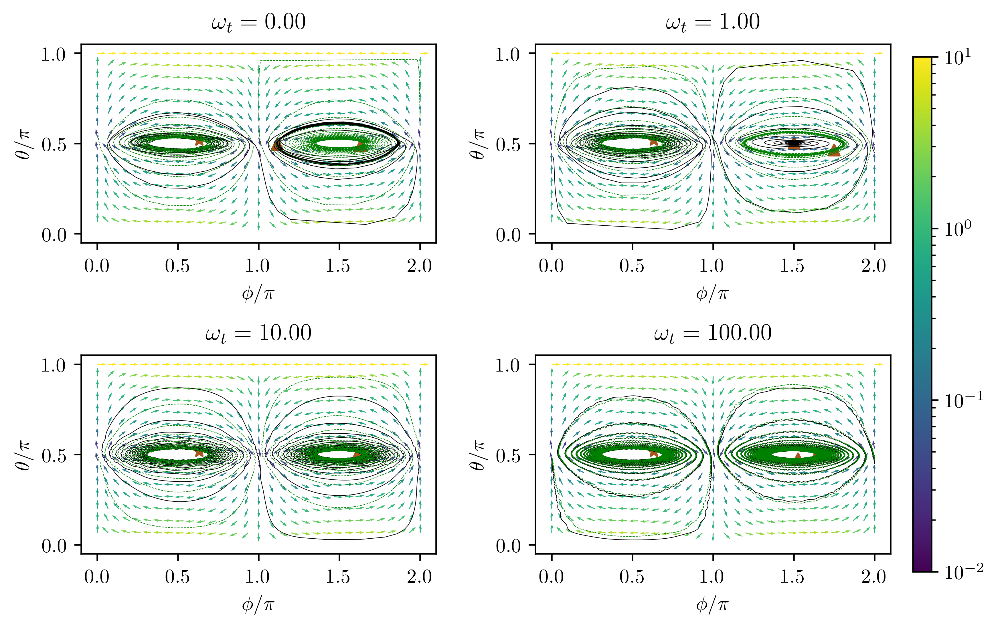

In [58]:
from matplotlib import colors as mcolors

# full version
omega_fun = lambda theta, phi, psi, wE2z, wE4x, wE4y, wax, way, waz: np.array((-(np.sin(phi)*(way*np.cos(psi) + wax*np.sin(psi))) + np.cos(phi)*(wax*np.cos(psi)*np.cos(theta) - way*np.cos(theta)*np.sin(psi) + waz*np.sin(theta)) + (np.cos(phi)**2*np.cos(theta)*(wE2z + (-wE2z + wE4x)*np.cos(2*theta)) + wE4x*np.cos(theta)*np.sin(phi)**2 + wE4y*np.cos(phi)*np.sin(phi)*np.sin(theta)**2)/2.,(1 + wE4y*np.cos(phi)**2*np.cos(2*theta) + 2*np.cos(phi)*(way*np.cos(psi) + wax*np.sin(psi)) + np.cos(theta)*np.sin(phi)*(2*wax*np.cos(psi) + wE4y*np.cos(theta)*np.sin(phi) - 2*way*np.sin(psi)) + 2*waz*np.sin(phi)*np.sin(theta) + (wE2z - wE4x)*np.cos(theta)*np.sin(2*phi)*np.sin(theta)**2)/2.,((-2*wax*np.cos(psi) + np.cos(phi)*(wE2z + (wE2z - wE4x)*np.cos(2*theta)) + 2*way*np.sin(psi))*np.sin(theta))/2. + np.cos(theta)*(waz - (wE4y*np.sin(phi)*np.sin(theta))/2.)))
dthdphdps_fun = lambda theta, phi, psi, wE2z, wE4x, wE4y, wax, way, waz: np.array(((np.cos(phi) + 2*way*np.cos(psi) + wE4y*np.cos(phi)*np.cos(2*theta) - wE4x*np.cos(theta)*np.sin(phi) + 2*wax*np.sin(psi))/2.,(-((1 + wE4y)/np.tan(theta)*np.sin(phi)) - 1/np.sin(theta)*(2*wax*np.cos(psi) + wE4x*np.cos(phi)*np.cos(2*theta) - 2*way*np.sin(psi)))/2.,(4*waz + 4*wax*np.cos(psi)/np.tan(theta) + 2*np.cos(phi)*(wE2z + (-wE2z + wE4x)*np.cos(2*theta))/np.tan(theta) + wE4y*np.cos(theta)/np.tan(theta)*np.sin(phi) + 2/np.sin(theta)*np.sin(phi) + wE4y/np.sin(theta)*np.sin(phi) - 4*way/np.tan(theta)*np.sin(psi) - wE4y*np.sin(phi)*np.sin(theta))/4.))

wE2z, wE4x, wE4y = 0.0126459, -0.01194913, 0.9581018 # ecoC01B05_baseFlow_avr
wax, way, waz = -1.31786126e-03, -1.23559401e-03, -7.57100877e-01 # ecoC01B05_baseFlow_avr
wt = 0
figsize = np.array((13, 9)) * 0.5
dpi = 500
vmin, vmax = 10 ** -2, 10 ** 1
psi = 0
theta = np.linspace(0, 1, 16) * np.pi
phi = np.linspace(0, 2, 31) * np.pi
theta, phi = np.meshgrid(theta, phi)

# # omega_c version
# dthphpsM = np.array(((-np.sin(phi), np.cos(phi), 0), 
#                      (-np.cos(phi) / np.tan(theta), -np.sin(phi) / np.tan(theta), 1), 
#                      (np.cos(phi) / np.sin(theta), np.sin(phi) / np.sin(theta), 0)))
# omega = omega_fun(theta, phi, psi, wE2z, wE4x, wE4y, wax * wt, way * wt, waz * wt)
# dth = np.sum([dthphpsM[0, i0] * omega[i0] for i0 in range(3)], axis=0)
# dph = np.sum([dthphpsM[1, i0] * omega[i0] for i0 in range(3)], axis=0)
# dps = np.sum([dthphpsM[2, i0] * omega[i0] for i0 in range(3)], axis=0)

# dthdphdps version
dth, dph, dps = dthdphdps_fun(theta, phi, psi, wE2z, wE4x, wE4y, wax * wt, way * wt, waz * wt)

norm_dthdph = np.sqrt(dth ** 2 + dph ** 2)
dth = dth / norm_dthdph
dph = dph / norm_dthdph

# simulation 
# t_theta, t_phi, t_psi = 0, 0, 0
t_theta, t_phi, t_psi = 1.629, (2 * np.pi - 4.300), 3.222,
max_t = 2000
update_fun='5bs'
rtol=1e-6
atol=1e-9
eval_dt = 0.001
save_every = 1
table_name1 = 'ecoC01B05_baseFlow'
table_name2 = 'ecoC01B05_baseFlow_avr'
omega_tail_list = np.array((0, 1, 10, 100))
# omega_tail_list = np.array((0, 0, 0, 0))
flow_strength = 1

tnorm = np.array((np.sin(t_theta) * np.cos(t_phi), np.sin(t_theta) * np.sin(t_phi), np.cos(t_theta)))
tdata_list = []
for omega_tail in omega_tail_list:
    tdata1 = spf_tb.do_ShearFlowPetsc4nPsiObj(tnorm, t_psi, max_t, update_fun=update_fun, 
                                          rtol=rtol, atol=atol, eval_dt=eval_dt, 
                                          save_every=save_every, table_name=table_name1, 
                                          omega_tail=omega_tail, flow_strength=flow_strength)
    tdata2 = spf_tb.do_ShearFlowPetsc4nPsiObj(tnorm, t_psi, max_t, update_fun=update_fun, 
                                          rtol=rtol, atol=atol, eval_dt=eval_dt, 
                                          save_every=save_every, table_name=table_name2, 
                                          omega_tail=omega_tail, flow_strength=flow_strength)
    tdata_list.append((tdata1, tdata2))
   
# # show, polar
# fig, axs = plt.subplots(1, 1, figsize=figsize, dpi=dpi, subplot_kw=dict(polar=True))
# fig.patch.set_facecolor('white')
# axi = axs
# cmap = plt.get_cmap('jet')
# norm = mcolors.LogNorm(vmin=vmin, vmax=vmax)
# axi.plot(Table_phi, Table_theta, '-k', alpha=0.2)
# im = axi.quiver(phi, theta, dph, dth, norm_dthdph, cmap=cmap, norm=norm)
# # im = axi.quiver(phi / np.pi, theta / np.pi, dph, dth, norm_dthdph, cmap=cmap, norm=norm)
# fig.colorbar(im, ax=axi)
# # axi.set_xlabel('$\\phi / \\pi$')
# # axi.set_ylabel('$\\theta / \\pi$')
# plt.tight_layout()

# show, standard
fig, axs = plt.subplots(2, 2, figsize=figsize, dpi=dpi)
fig.patch.set_facecolor('white')
axi = axs
cmap = plt.get_cmap('viridis')
norm = mcolors.LogNorm(vmin=vmin, vmax=vmax)
for axi, omega_tail, (tdata1, tdata2) in zip(axs.ravel(), omega_tail_list, tdata_list):
    for tdata, linsty in zip((tdata1, tdata2), ('-k', '--g')):
        Table_t, Table_dt, Table_X, Table_P, Table_P2, Table_theta, Table_phi, Table_psi, Table_eta = tdata
        axi.scatter(Table_phi[0] / np.pi, Table_theta[0] / np.pi, marker='*', s=30, c='#a9561e')
        axi.scatter(Table_phi[-1] / np.pi, Table_theta[-1] / np.pi, marker='^', s=30, c='#a9561e')
        for i0, i1 in spf_tb.separate_angle_idx(Table_phi):
            axi.plot(Table_phi[i0:i1] / np.pi, Table_theta[i0:i1] / np.pi, linsty, alpha=1, linewidth=0.3)
    im = axi.quiver(phi / np.pi, theta / np.pi, dph, dth, norm_dthdph, cmap=cmap, norm=norm)
    axi.set_xlabel('$\\phi / \\pi$')
    axi.set_ylabel('$\\theta / \\pi$')
    axi.set_title('$\\omega_t = %.2f$' % omega_tail)
plt.tight_layout()
cax = fig.add_axes([1, 0.1, 0.02, 0.8])
fig.colorbar(im, cax=cax)


In [ ]:
figsize = np.array((16, 9)) * 0.4
dpi = 500

# show, standard
fig, axs = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
fig.patch.set_facecolor('white')
axi = axs
cmap = plt.get_cmap('jet')
norm = mcolors.LogNorm(vmin=vmin, vmax=vmax)
for tdata, linsty in zip((tdata1, tdata2), ('-k', '--g')):
    Table_t, Table_dt, Table_X, Table_P, Table_P2, Table_theta, Table_phi, Table_psi, Table_eta = tdata
    axi.scatter(Table_phi[0] / np.pi, Table_theta[0] / np.pi, marker='*', s=30, c='#a9561e')
    axi.scatter(Table_phi[-1] / np.pi, Table_theta[-1] / np.pi, marker='^', s=30, c='#a9561e')
    for i0, i1 in spf_tb.separate_angle_idx(Table_phi):
        axi.plot(Table_phi[i0:i1] / np.pi, Table_theta[i0:i1] / np.pi, linsty, alpha=1, linewidth=0.3)
im = axi.quiver(phi / np.pi, theta / np.pi, dph, dth, norm_dthdph, cmap=cmap, norm=norm)
fig.colorbar(im, ax=axi)
axi.set_xlabel('$\\phi / \\pi$')
axi.set_ylabel('$\\theta / \\pi$')
axi.set_title('$\\omega_t = %.2f$' % omega_tail)
plt.tight_layout()

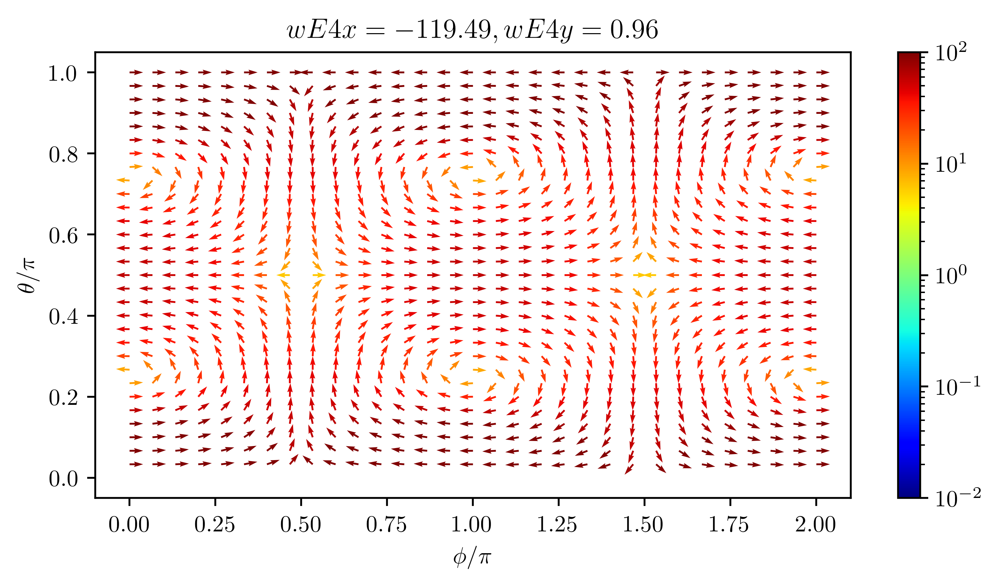

In [18]:
# full version
# omega_fun = lambda theta, phi, psi, wE2z, wE4x, wE4y, wax, way, waz: np.array((-(np.sin(phi)*(way*np.cos(psi) + wax*np.sin(psi))) + np.cos(phi)*(wax*np.cos(psi)*np.cos(theta) - way*np.cos(theta)*np.sin(psi) + waz*np.sin(theta)) + (np.cos(phi)**2*np.cos(theta)*(wE2z + (-wE2z + wE4x)*np.cos(2*theta)) + wE4x*np.cos(theta)*np.sin(phi)**2 + wE4y*np.cos(phi)*np.sin(phi)*np.sin(theta)**2)/2.,(1 + wE4y*np.cos(phi)**2*np.cos(2*theta) + 2*np.cos(phi)*(way*np.cos(psi) + wax*np.sin(psi)) + np.cos(theta)*np.sin(phi)*(2*wax*np.cos(psi) + wE4y*np.cos(theta)*np.sin(phi) - 2*way*np.sin(psi)) + 2*waz*np.sin(phi)*np.sin(theta) + (wE2z - wE4x)*np.cos(theta)*np.sin(2*phi)*np.sin(theta)**2)/2.,((-2*wax*np.cos(psi) + np.cos(phi)*(wE2z + (wE2z - wE4x)*np.cos(2*theta)) + 2*way*np.sin(psi))*np.sin(theta))/2. + np.cos(theta)*(waz - (wE4y*np.sin(phi)*np.sin(theta))/2.)))
# dthdphdps_fun = lambda theta, phi, psi, wE2z, wE4x, wE4y, wax, way, waz: np.array(((np.cos(phi) + 2*way*np.cos(psi) + wE4y*np.cos(phi)*np.cos(2*theta) - wE4x*np.cos(theta)*np.sin(phi) + 2*wax*np.sin(psi))/2.,(-((1 + wE4y)/np.tan(theta)*np.sin(phi)) - 1/np.sin(theta)*(2*wax*np.cos(psi) + wE4x*np.cos(phi)*np.cos(2*theta) - 2*way*np.sin(psi)))/2.,(4*waz + 4*wax*np.cos(psi)/np.tan(theta) + 2*np.cos(phi)*(wE2z + (-wE2z + wE4x)*np.cos(2*theta))/np.tan(theta) + wE4y*np.cos(theta)/np.tan(theta)*np.sin(phi) + 2/np.sin(theta)*np.sin(phi) + wE4y/np.sin(theta)*np.sin(phi) - 4*way/np.tan(theta)*np.sin(psi) - wE4y*np.sin(phi)*np.sin(theta))/4.))
omega_fun = lambda theta, phi, psi, mywS, wE2z, wE4x, wE4y, wax, way, waz: np.array((-(np.sin(phi)*(way*np.cos(psi) + wax*np.sin(psi))) + np.cos(phi)*(wax*np.cos(psi)*np.cos(theta) - way*np.cos(theta)*np.sin(psi) + waz*np.sin(theta)) + (np.cos(phi)**2*np.cos(theta)*(wE2z + (-wE2z + wE4x)*np.cos(2*theta)) + wE4x*np.cos(theta)*np.sin(phi)**2 + wE4y*np.cos(phi)*np.sin(phi)*np.sin(theta)**2)/2.,mywS + np.cos(phi)*(way*np.cos(psi) + wax*np.sin(psi)) + np.sin(phi)*(wax*np.cos(psi)*np.cos(theta) - way*np.cos(theta)*np.sin(psi) + waz*np.sin(theta)) + (wE4y + 3*wE4y*np.cos(2*theta) - 2*(wE4y*np.cos(2*phi) + 2*(-wE2z + wE4x)*np.cos(theta)*np.sin(2*phi))*np.sin(theta)**2)/8.,((-2*wax*np.cos(psi) + np.cos(phi)*(wE2z + (wE2z - wE4x)*np.cos(2*theta)) + 2*way*np.sin(psi))*np.sin(theta))/2. + np.cos(theta)*(waz - (wE4y*np.sin(phi)*np.sin(theta))/2.)))
dthdphdps_fun = lambda theta, phi, psi, mywS, wE2z, wE4x, wE4y, wax, way, waz: np.array((way*np.cos(psi) + np.cos(phi)*(mywS + (wE4y*np.cos(2*theta))/2.) - (wE4x*np.cos(theta)*np.sin(phi))/2. + wax*np.sin(psi),-((2*mywS + wE4y)/np.tan(theta)*np.sin(phi))/2. - (1/np.sin(theta)*(2*wax*np.cos(psi) + wE4x*np.cos(phi)*np.cos(2*theta) - 2*way*np.sin(psi)))/2.,(4*waz + 4*wax*np.cos(psi)/np.tan(theta) + 2*np.cos(phi)*(wE2z + (-wE2z + wE4x)*np.cos(2*theta))/np.tan(theta) + wE4y*np.cos(theta)/np.tan(theta)*np.sin(phi) + 4*mywS/np.sin(theta)*np.sin(phi) + wE4y/np.sin(theta)*np.sin(phi) - 4*way/np.tan(theta)*np.sin(psi) - wE4y*np.sin(phi)*np.sin(theta))/4.))

# mywS = 0
# wE2z, wE4x, wE4y = 0, 0, 0
mywS = 1 / 2 # simple shear
wE2z, wE4x, wE4y = 0.0126459, -0.01194913 * 10000, 0.9581018 # ecoC01B05_baseFlow_avr

# mywS = 1 / 2 # simple shear
# wE2z, wE4x, wE4y = 0.0126459, -0.01194913 * 10 ** 2, 0.9581018 # a potential model
# wax, way, waz = -1.31786126e-03, -1.23559401e-03, -7.57100877e-01 # ecoC01B05_baseFlow_avr
# wt = 0

figsize = np.array((16, 9)) * 0.4
dpi = 500
vmin, vmax = 10 ** -2, 10 ** 2
psi_list = np.linspace(0, 2, 1) * np.pi
theta = np.linspace(0, np.pi, 31)
phi = np.linspace(0, 2*np.pi, 31)
# theta = np.linspace(-np.pi/2, np.pi/2, 30)
# phi = np.linspace(-np.pi/2, np.pi/2*3, 30)
# theta = np.linspace(-np.pi/4, np.pi/4*3, 30)
# phi = np.linspace(-np.pi/2, np.pi/2*3, 30)
# theta, phi = np.meshgrid(theta, phi, indexing='ij')
theta, phi = np.meshgrid(theta, phi)

for psi in psi_list:
    dth, dph, dps = dthdphdps_fun(theta, phi, psi, mywS, wE2z, wE4x, wE4y, wax * wt, way * wt, waz * wt)
    # fig, axs = plt.subplots(1, 1, figsize=figsize, dpi=dpi, subplot_kw=dict(polar=True))
    fig, axs = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
    fig.patch.set_facecolor('white')
    axi = axs
    norm_dthdph = np.sqrt(dth ** 2 + dph ** 2)
    dth = dth / norm_dthdph
    dph = dph / norm_dthdph
    cmap = plt.get_cmap('jet')
    norm = mcolors.LogNorm(vmin=vmin, vmax=vmax)
    im = axi.quiver(phi / np.pi, theta / np.pi, dph, dth, norm_dthdph, cmap=cmap, norm=norm)
    fig.colorbar(im, ax=axi)
    axi.set_xlabel('$\\phi / \\pi$')
    axi.set_ylabel('$\\theta / \\pi$')
#     axi.set_title('$\\omega_t = %.2f$' % wt)
    axi.set_title('$wE4x = %.2f, wE4y = %.2f$' % (wE4x, wE4y))
    plt.tight_layout()

In [47]:
np.linspace(0, 1, 16)

array([0.        , 0.06666667, 0.13333333, 0.2       , 0.26666667,
       0.33333333, 0.4       , 0.46666667, 0.53333333, 0.6       ,
       0.66666667, 0.73333333, 0.8       , 0.86666667, 0.93333333,
       1.        ])

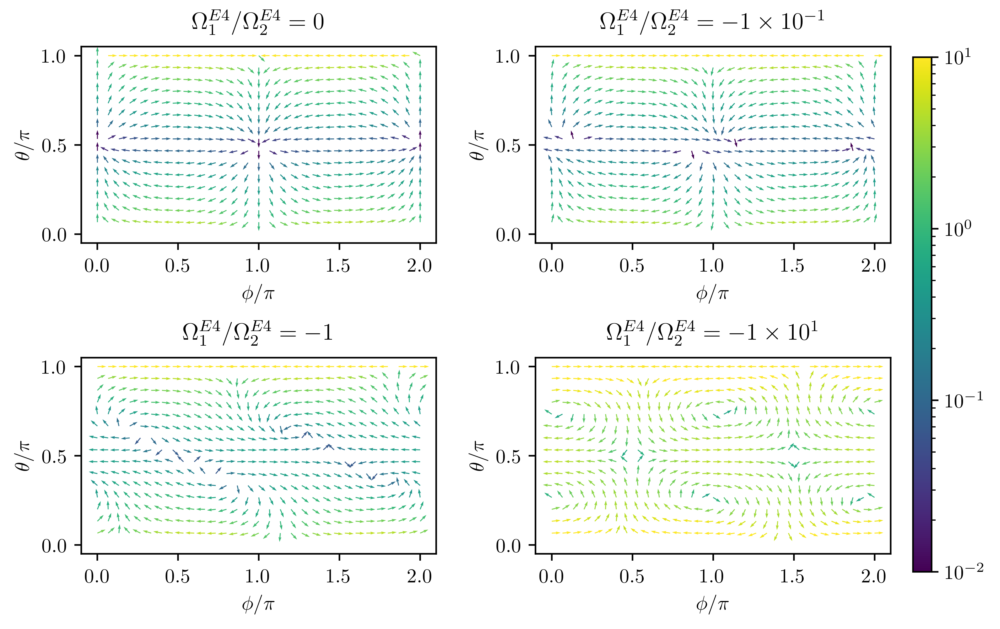

In [49]:
# full version
omega_fun = lambda theta, phi, psi, mywS, wE2z, wE4x, wE4y, wax, way, waz: np.array((-(np.sin(phi)*(way*np.cos(psi) + wax*np.sin(psi))) + np.cos(phi)*(wax*np.cos(psi)*np.cos(theta) - way*np.cos(theta)*np.sin(psi) + waz*np.sin(theta)) + (np.cos(phi)**2*np.cos(theta)*(wE2z + (-wE2z + wE4x)*np.cos(2*theta)) + wE4x*np.cos(theta)*np.sin(phi)**2 + wE4y*np.cos(phi)*np.sin(phi)*np.sin(theta)**2)/2.,mywS + np.cos(phi)*(way*np.cos(psi) + wax*np.sin(psi)) + np.sin(phi)*(wax*np.cos(psi)*np.cos(theta) - way*np.cos(theta)*np.sin(psi) + waz*np.sin(theta)) + (wE4y + 3*wE4y*np.cos(2*theta) - 2*(wE4y*np.cos(2*phi) + 2*(-wE2z + wE4x)*np.cos(theta)*np.sin(2*phi))*np.sin(theta)**2)/8.,((-2*wax*np.cos(psi) + np.cos(phi)*(wE2z + (wE2z - wE4x)*np.cos(2*theta)) + 2*way*np.sin(psi))*np.sin(theta))/2. + np.cos(theta)*(waz - (wE4y*np.sin(phi)*np.sin(theta))/2.)))
dthdphdps_fun = lambda theta, phi, psi, mywS, wE2z, wE4x, wE4y, wax, way, waz: np.array((way*np.cos(psi) + np.cos(phi)*(mywS + (wE4y*np.cos(2*theta))/2.) - (wE4x*np.cos(theta)*np.sin(phi))/2. + wax*np.sin(psi),-((2*mywS + wE4y)/np.tan(theta)*np.sin(phi))/2. - (1/np.sin(theta)*(2*wax*np.cos(psi) + wE4x*np.cos(phi)*np.cos(2*theta) - 2*way*np.sin(psi)))/2.,(4*waz + 4*wax*np.cos(psi)/np.tan(theta) + 2*np.cos(phi)*(wE2z + (-wE2z + wE4x)*np.cos(2*theta))/np.tan(theta) + wE4y*np.cos(theta)/np.tan(theta)*np.sin(phi) + 4*mywS/np.sin(theta)*np.sin(phi) + wE4y/np.sin(theta)*np.sin(phi) - 4*way/np.tan(theta)*np.sin(psi) - wE4y*np.sin(phi)*np.sin(theta))/4.))

mywS = 1 / 2 # simple shear
# wE2z, wE4x0, wE4y0 = 0.0126459, -0.01194913, 0.9581018 # ecoC01B05_baseFlow_avr
wE2z, wE4x0, wE4y0 = 0, 0.1, 1 # ecoC01B05_baseFlow_avr
wE4x_fct_list = np.hstack((0, -10 ** np.linspace(0, 2, 3)))
wE4y_fct_list = [1, ]

figsize = np.array((13, 9)) * 0.5
dpi = 500
vmin, vmax = 10 ** -2, 10 ** 1
psi_list = np.linspace(0, 2, 1) * np.pi
theta = np.linspace(0, 1, 16) * np.pi
phi = np.linspace(0, 2, 31) * np.pi
theta, phi = np.meshgrid(theta, phi)

fig, axs = plt.subplots(2, 2, figsize=figsize, dpi=dpi, constrained_layout=False)
fig.patch.set_facecolor('white')
cmap = plt.get_cmap('viridis')
norm = mcolors.LogNorm(vmin=vmin, vmax=vmax)
wE4x_fct_list, wE4y_fct_list = np.meshgrid(wE4x_fct_list, wE4y_fct_list)
for axi, wE4x_fct, wE4y_fct in zip(axs.ravel(), wE4x_fct_list.ravel(), wE4y_fct_list.ravel()):
    wE4x = wE4x0 * wE4x_fct
    wE4y = wE4y0 * wE4y_fct
    dth, dph, dps = dthdphdps_fun(theta, phi, psi, mywS, wE2z, wE4x, wE4y, wax * wt, way * wt, waz * wt)
    norm_dthdph = np.sqrt(dth ** 2 + dph ** 2)
    dth = dth / norm_dthdph
    dph = dph / norm_dthdph
    im = axi.quiver(phi / np.pi, theta / np.pi, dph, dth, norm_dthdph, cmap=cmap, norm=norm)
    axi.set_xlabel('$\\phi / \\pi$')
    axi.set_ylabel('$\\theta / \\pi$')
    axi.set_title('$\\Omega_1^{E4} / \\Omega_2^{E4} = \\num{%.0e}$' % (wE4x / wE4y))
plt.tight_layout()
    
cax = fig.add_axes([1, 0.1, 0.02, 0.8])
fig.colorbar(im, cax=cax)

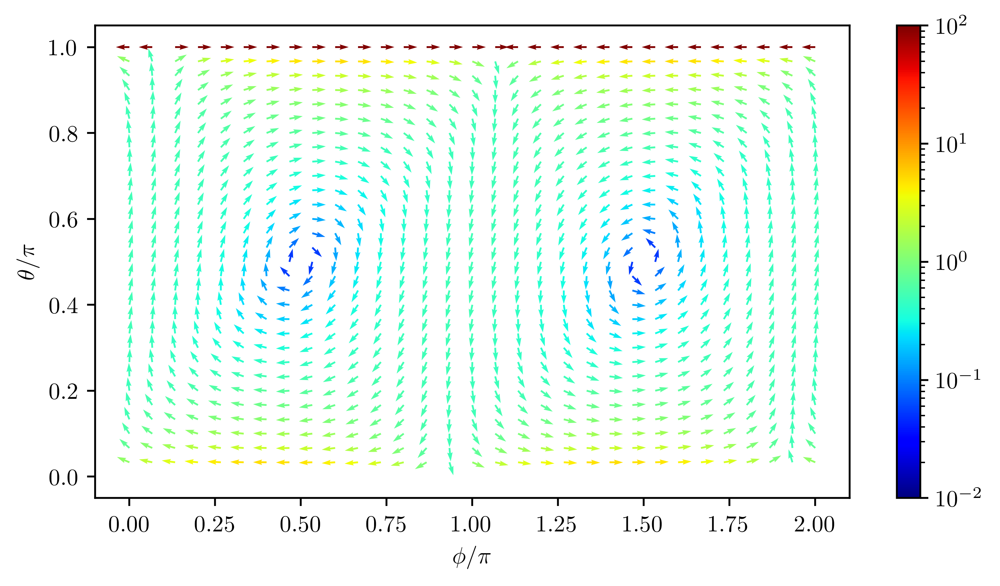

In [46]:
# full version
# omega_fun = lambda theta, phi, psi, wE2z, wE4x, wE4y, wax, way, waz: np.array((-(np.sin(phi)*(way*np.cos(psi) + wax*np.sin(psi))) + np.cos(phi)*(wax*np.cos(psi)*np.cos(theta) - way*np.cos(theta)*np.sin(psi) + waz*np.sin(theta)) + (np.cos(phi)**2*np.cos(theta)*(wE2z + (-wE2z + wE4x)*np.cos(2*theta)) + wE4x*np.cos(theta)*np.sin(phi)**2 + wE4y*np.cos(phi)*np.sin(phi)*np.sin(theta)**2)/2.,(1 + wE4y*np.cos(phi)**2*np.cos(2*theta) + 2*np.cos(phi)*(way*np.cos(psi) + wax*np.sin(psi)) + np.cos(theta)*np.sin(phi)*(2*wax*np.cos(psi) + wE4y*np.cos(theta)*np.sin(phi) - 2*way*np.sin(psi)) + 2*waz*np.sin(phi)*np.sin(theta) + (wE2z - wE4x)*np.cos(theta)*np.sin(2*phi)*np.sin(theta)**2)/2.,((-2*wax*np.cos(psi) + np.cos(phi)*(wE2z + (wE2z - wE4x)*np.cos(2*theta)) + 2*way*np.sin(psi))*np.sin(theta))/2. + np.cos(theta)*(waz - (wE4y*np.sin(phi)*np.sin(theta))/2.)))
# dthdphdps_fun = lambda theta, phi, psi, wE2z, wE4x, wE4y, wax, way, waz: np.array(((np.cos(phi) + 2*way*np.cos(psi) + wE4y*np.cos(phi)*np.cos(2*theta) - wE4x*np.cos(theta)*np.sin(phi) + 2*wax*np.sin(psi))/2.,(-((1 + wE4y)/np.tan(theta)*np.sin(phi)) - 1/np.sin(theta)*(2*wax*np.cos(psi) + wE4x*np.cos(phi)*np.cos(2*theta) - 2*way*np.sin(psi)))/2.,(4*waz + 4*wax*np.cos(psi)/np.tan(theta) + 2*np.cos(phi)*(wE2z + (-wE2z + wE4x)*np.cos(2*theta))/np.tan(theta) + wE4y*np.cos(theta)/np.tan(theta)*np.sin(phi) + 2/np.sin(theta)*np.sin(phi) + wE4y/np.sin(theta)*np.sin(phi) - 4*way/np.tan(theta)*np.sin(psi) - wE4y*np.sin(phi)*np.sin(theta))/4.))
omega_fun = lambda theta, phi, psi, mywS, wE2z, wE4x, wE4y, wax, way, waz: np.array((-(np.sin(phi)*(way*np.cos(psi) + wax*np.sin(psi))) + np.cos(phi)*(wax*np.cos(psi)*np.cos(theta) - way*np.cos(theta)*np.sin(psi) + waz*np.sin(theta)) + (np.cos(phi)**2*np.cos(theta)*(wE2z + (-wE2z + wE4x)*np.cos(2*theta)) + wE4x*np.cos(theta)*np.sin(phi)**2 + wE4y*np.cos(phi)*np.sin(phi)*np.sin(theta)**2)/2.,mywS + np.cos(phi)*(way*np.cos(psi) + wax*np.sin(psi)) + np.sin(phi)*(wax*np.cos(psi)*np.cos(theta) - way*np.cos(theta)*np.sin(psi) + waz*np.sin(theta)) + (wE4y + 3*wE4y*np.cos(2*theta) - 2*(wE4y*np.cos(2*phi) + 2*(-wE2z + wE4x)*np.cos(theta)*np.sin(2*phi))*np.sin(theta)**2)/8.,((-2*wax*np.cos(psi) + np.cos(phi)*(wE2z + (wE2z - wE4x)*np.cos(2*theta)) + 2*way*np.sin(psi))*np.sin(theta))/2. + np.cos(theta)*(waz - (wE4y*np.sin(phi)*np.sin(theta))/2.)))
dthdphdps_fun = lambda theta, phi, psi, mywS, wE2z, wE4x, wE4y, wax, way, waz: np.array((way*np.cos(psi) + np.cos(phi)*(mywS + (wE4y*np.cos(2*theta))/2.) - (wE4x*np.cos(theta)*np.sin(phi))/2. + wax*np.sin(psi),-((2*mywS + wE4y)/np.tan(theta)*np.sin(phi))/2. - (1/np.sin(theta)*(2*wax*np.cos(psi) + wE4x*np.cos(phi)*np.cos(2*theta) - 2*way*np.sin(psi)))/2.,(4*waz + 4*wax*np.cos(psi)/np.tan(theta) + 2*np.cos(phi)*(wE2z + (-wE2z + wE4x)*np.cos(2*theta))/np.tan(theta) + wE4y*np.cos(theta)/np.tan(theta)*np.sin(phi) + 4*mywS/np.sin(theta)*np.sin(phi) + wE4y/np.sin(theta)*np.sin(phi) - 4*way/np.tan(theta)*np.sin(psi) - wE4y*np.sin(phi)*np.sin(theta))/4.))

# mywS = 0
wE2z, wE4x, wE4y = 0, 0.25, 0
# mywS = 1 / 2 # simple shear
# wE2z, wE4x, wE4y = 0.0126459, -0.01194913, 0.9581018 # ecoC01B05_baseFlow_avr
mywS = 1 / 2 # simple shear
psi = 0
# wE2z, wE4x, wE4y = 0.026630, 0.164710, 0.421976  # a potential model
wax, way, waz = 0, 0, 0  # a potential model
wt = 0
figsize = np.array((16, 9)) * 0.4
dpi = 500
vmin, vmax = 10 ** -2, 10 ** 2
psi_list = np.linspace(0, 2, 1) * np.pi
theta = np.linspace(0, np.pi, 31)
phi = np.linspace(0, 2*np.pi, 31)
theta, phi = np.meshgrid(theta, phi)

dth, dph, dps = dthdphdps_fun(theta, phi, psi, mywS, wE2z, wE4x, wE4y, wax * wt, way * wt, waz * wt)
# fig, axs = plt.subplots(1, 1, figsize=figsize, dpi=dpi, subplot_kw=dict(polar=True))
fig, axs = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
fig.patch.set_facecolor('white')
axi = axs
norm_dthdph = np.sqrt(dth ** 2 + dph ** 2)
dth = dth / norm_dthdph
dph = dph / norm_dthdph
cmap = plt.get_cmap('jet')
norm = mcolors.LogNorm(vmin=vmin, vmax=vmax)
im = axi.quiver(phi / np.pi, theta / np.pi, dph, dth, norm_dthdph, cmap=cmap, norm=norm)
fig.colorbar(im, ax=axi)
axi.set_xlabel('$\\phi / \\pi$')
axi.set_ylabel('$\\theta / \\pi$')
# axi.set_title('$\\omega_1^{E4} / \\omega_2^{E4} = %.4f$' % (wE4x / wE4y))
plt.tight_layout()